<a href="https://colab.research.google.com/github/sidratulmuntahasara/WaterQuality-Classification-Model/blob/main/NGN112_Group_Project_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Classification of Water Quality**

*Below is a project give to group 6B on classifying the water quality and if it is safe or not.*


***`Importing the required libraries`***

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from mlxtend.plotting import plot_decision_regions

***`Importing the data and creating dataframe`***

In [ ]:
df = pd.read_csv('WaterQuality.csv')
df.head()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1


***`Printing the number of attributes and observations`***

In [ ]:
num_attribute = len(df.columns)
num_observations = len(df)
print("No. of attributes: ", num_attribute)
print("No. of observations", num_observations)

No. of attributes:  21
No. of observations 7999


*`Knowing the columns in our dataset`*

In [ ]:
for i in df.describe():
  print(i)

aluminium
arsenic
barium
cadmium
chloramine
chromium
copper
flouride
bacteria
viruses
lead
nitrates
nitrites
mercury
perchlorate
radium
selenium
silver
uranium


***`Other Information on the dataset`***

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

**This information reveals a lot about our dataset.**
```
- The data type 'float64' reveals that it is a numerical data and 'object' denotes a categorical data yet though they come under categorical, the values are still numerical.
- There are 7999 datas, and there are no null values.
```

## Statistical Summary

1. Mean
2. Median
3. Standard Deviation
4. Minimum Value
5. Maximum Value

> To calculate the statistical summary of all attributes, we use the `describe()` method to know more in depth

In [ ]:
df.describe()

,aluminium,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
count,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000
mean,0.666158,0.161445,1.567715,0.042806,2.176831,0.247226,0.805857,0.771565,0.319665,0.328583,0.099450,9.818822,1.329961,0.005194,16.460299,2.920548,0.049685,0.147781,0.044673
std,1.265145,0.252590,1.216091,0.036049,2.567027,0.270640,0.653539,0.435373,0.329485,0.378096,0.058172,5.541331,0.573219,0.002967,17.687474,2.323009,0.028770,0.143551,0.026904
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.405000,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000
50%,0.070000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.740000,2.410000,0.050000,0.080000,0.050000
75%,0.280000,0.100000,2.480000,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.480000,4.670000,0.070000,0.240000,0.070000
max,5.050000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000


## Graphical Summary

```
In the above information of dataset we noticed 2 of the attributes has some non-numerical datas.
Let's try to get deeper into that.
```

In [ ]:
is_safe_filt = df['is_safe'].unique()
print(is_safe_filt)

['1' '0' '#NUM!']


In [ ]:
ammonia_filt = df['ammonia'].unique()
print(ammonia_filt)
if '#NUM!' in ammonia_filt:
  print(True)

['9.08' '21.16' '14.02' ... '2.78' '27.12' '10']
True


In [ ]:
filt_data = df.query('is_safe != "#NUM!"')
filt_data = filt_data.query('ammonia != "#NUM!"')
filt_data.describe()

,aluminium,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
count,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,0.666396,0.161477,1.567928,0.042803,2.177589,0.247300,0.805940,0.771646,0.319714,0.328706,0.099431,9.819250,1.329846,0.005193,16.465266,2.920106,0.049684,0.147811,0.044672
std,1.265323,0.252632,1.216227,0.036049,2.567210,0.270663,0.653595,0.435423,0.329497,0.378113,0.058169,5.541977,0.573271,0.002967,17.688827,2.322805,0.028773,0.143569,0.026906
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.407500,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000
50%,0.070000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.745000,2.410000,0.050000,0.080000,0.050000
75%,0.280000,0.100000,2.482500,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.487500,4.670000,0.070000,0.240000,0.070000
max,5.050000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000


In [ ]:
ammonia_filt = filt_data['ammonia'].unique()
if '#NUM!' in ammonia_filt:
  print(True)
else:
  print(False)

False


> **So we found that there was a non-numerical unwanted data `#NUM!` which is useless and is non-integer, so we removed it from our dataframe, and continue to create graphical summaries on the numerical datas. The new dataframe we called it as `filt_data`**



### 1. Histogram

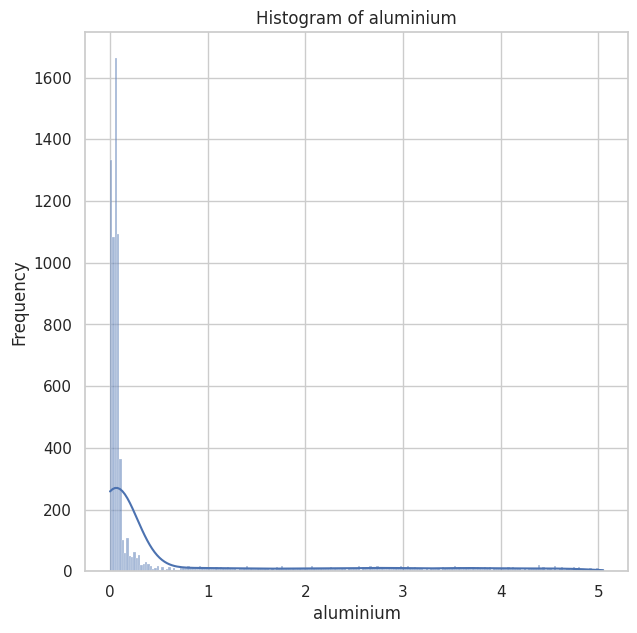

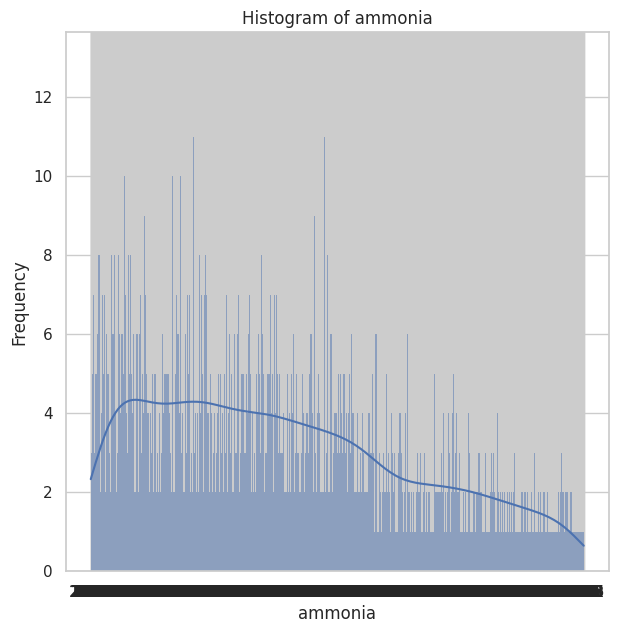

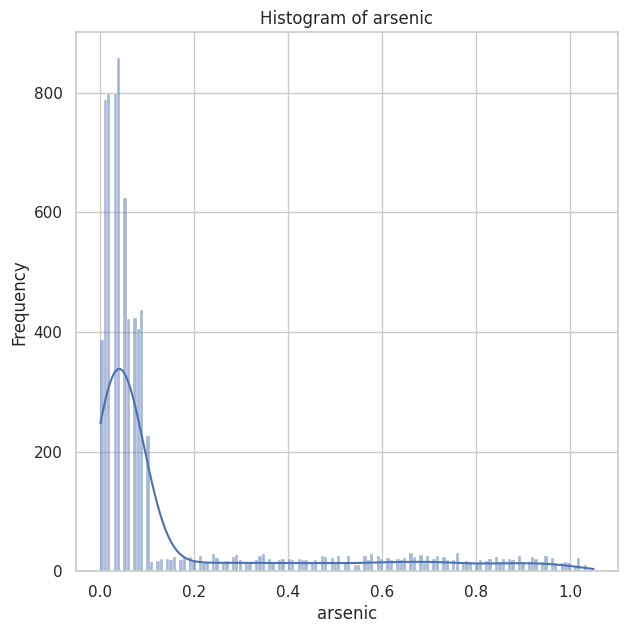

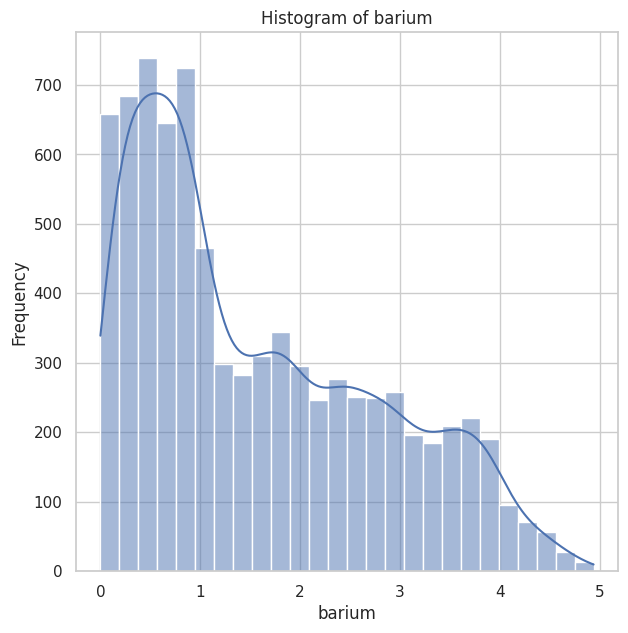

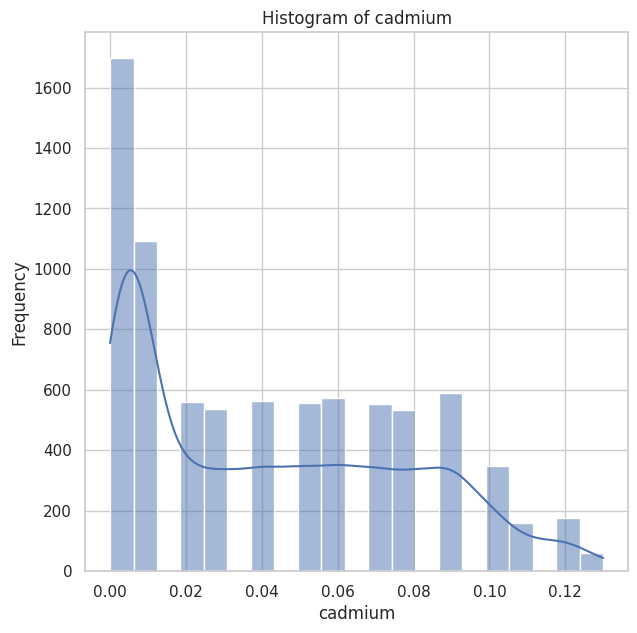

...

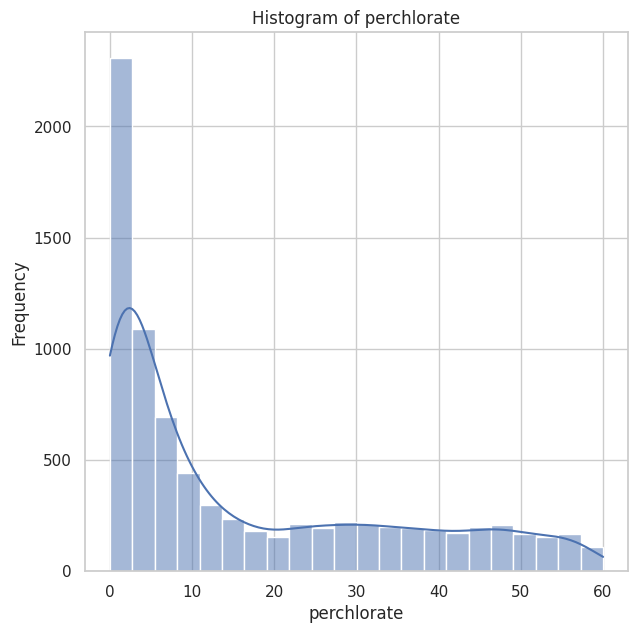

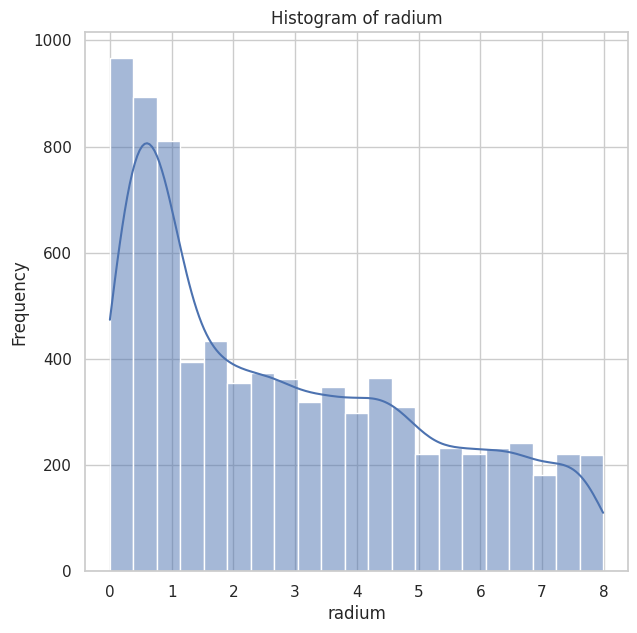

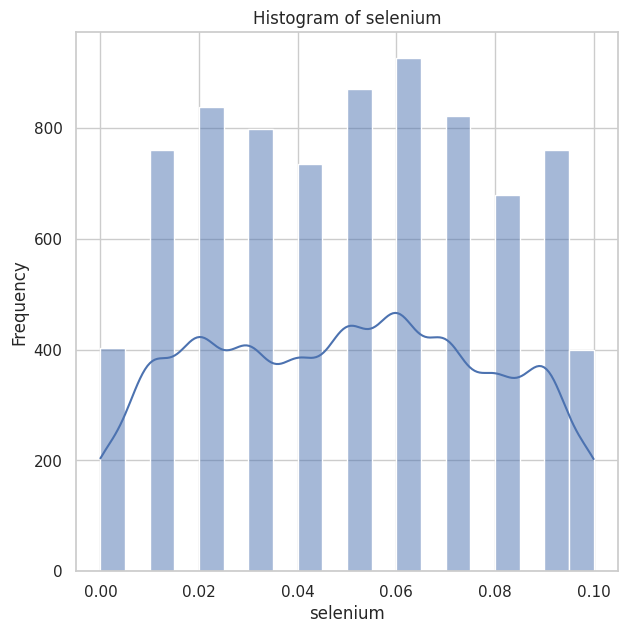

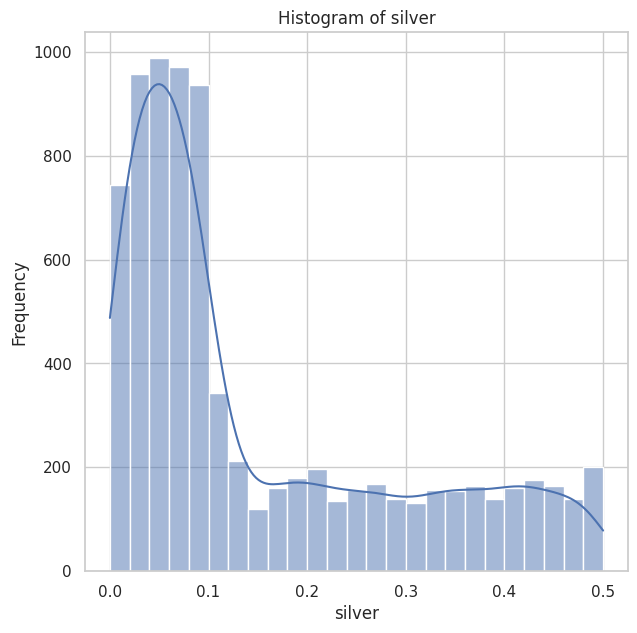

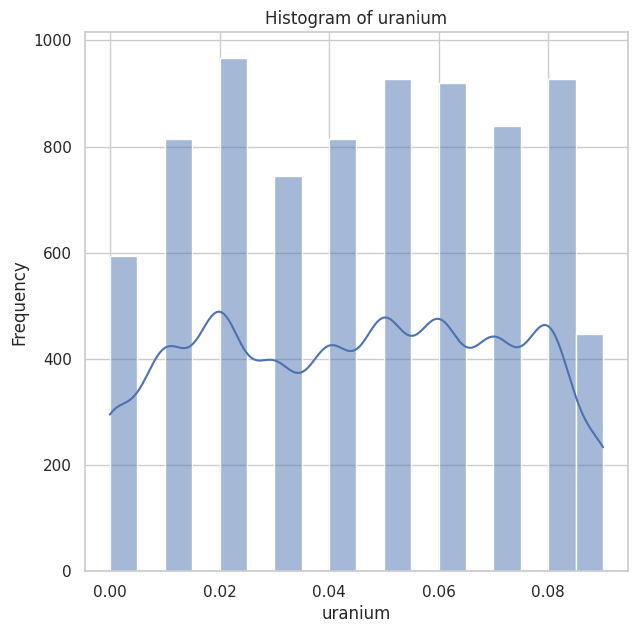

In [ ]:
for i in filt_data.columns[:-1]:
  sns.set(style="whitegrid")
  plt.figure(figsize=(7,7))
  plt.title(f"Histogram of {i}")
  plt.xlabel(i)
  plt.ylabel('Frequency')
  sns.histplot(filt_data[i], kde=True)
  plt.show()
  print('\n')

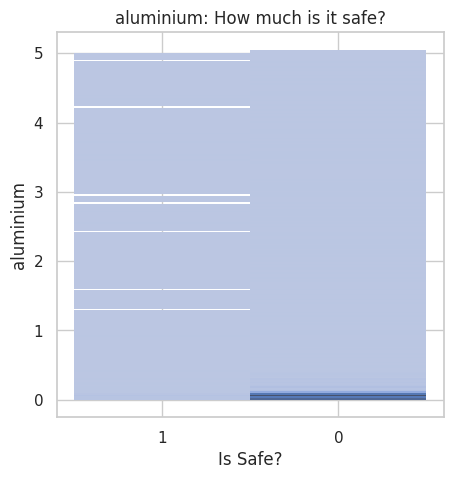

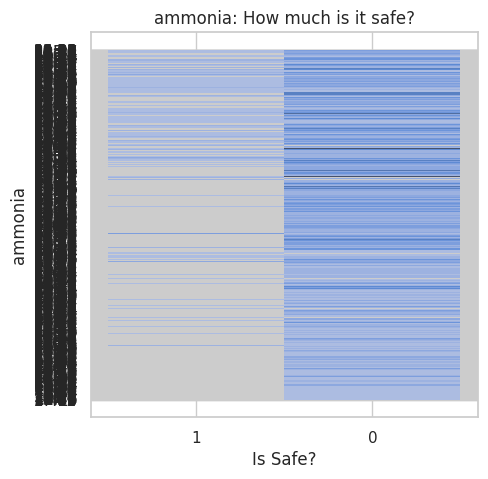

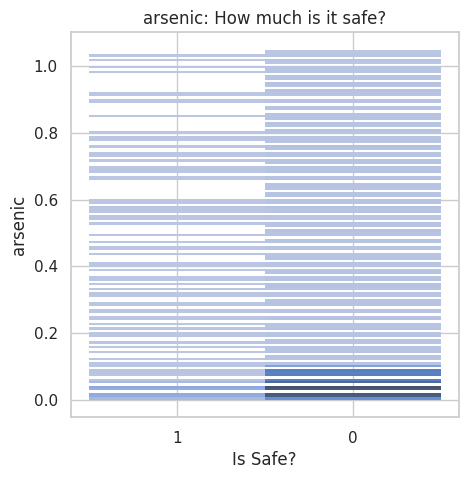

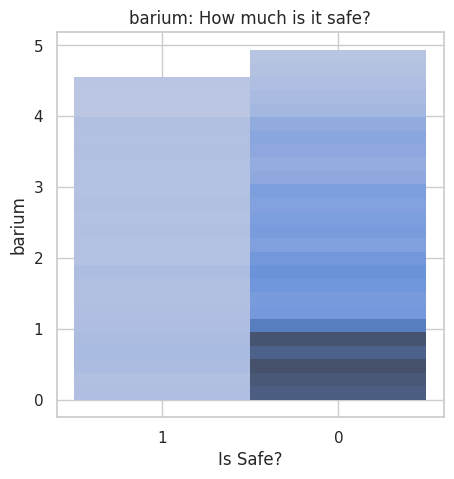

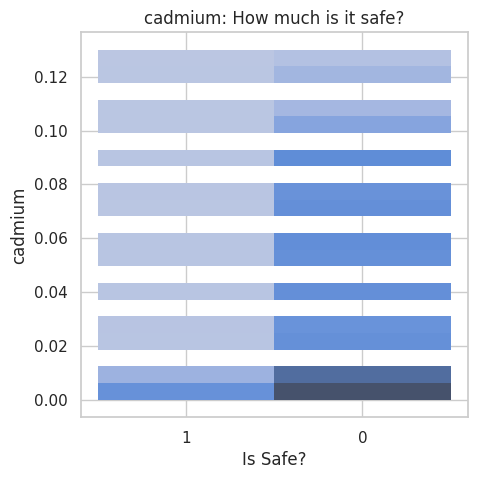

...

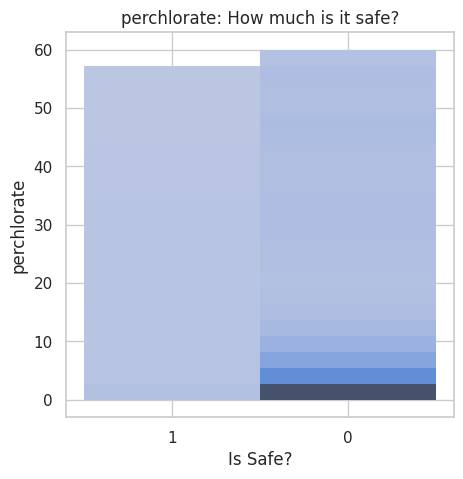

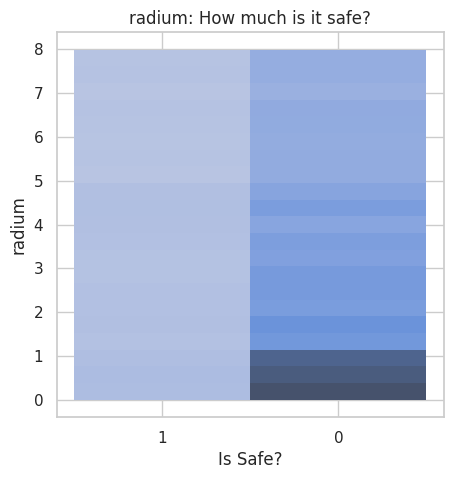

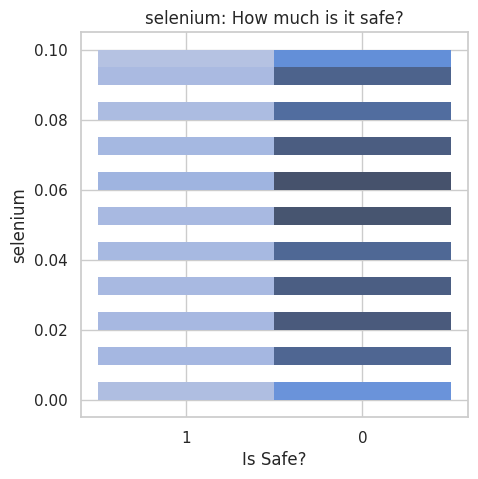

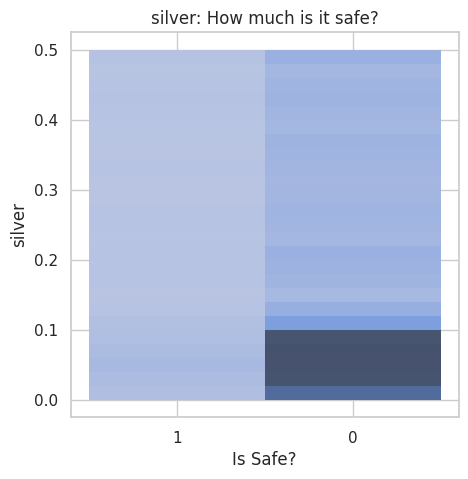

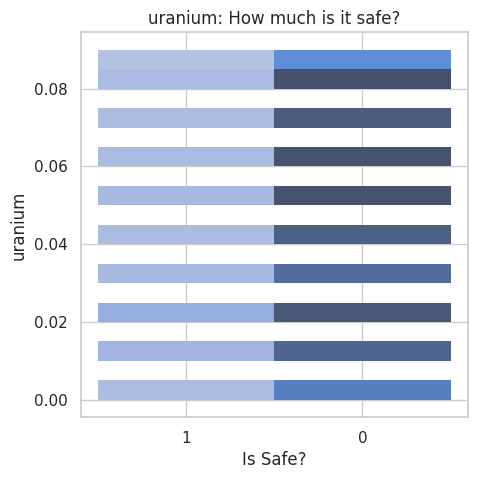

In [ ]:
for i in filt_data.columns[:-1]:
  sns.set(style="whitegrid")
  plt.figure(figsize=(5,5))
  plt.title(f"{i}: How much is it safe?")
  plt.xlabel('Is Safe?')
  plt.ylabel(i)
  sns.histplot(x='is_safe', y=filt_data[i], data=filt_data)
  plt.show()
  print('\n')

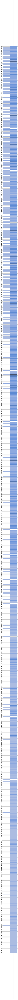

uranium


In [ ]:
# Zooming Deeper into Ammonia VS Is it Safe? Histogram to get a clearer idea on the graphs

sns.set(style="whitegrid")
plt.figure(figsize=(10,600))
sns.histplot(x='is_safe', y='ammonia', data=filt_data)
plt.show()
print(i)

### 2. Pie Chart

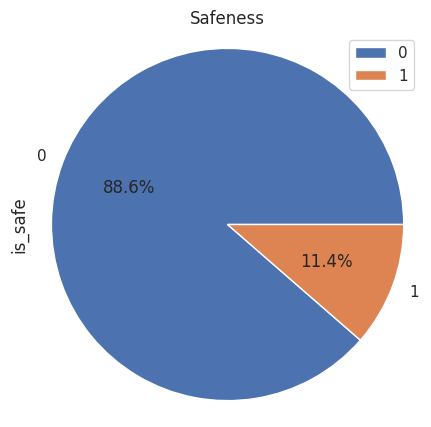

In [ ]:
# the number of occurences of Safe and Not Safe water quality
absolute_frequencies = filt_data['is_safe'].value_counts()
#Plotting pie chart
df2 = pd.DataFrame({'is_safe' : absolute_frequencies})
df2.plot.pie(y='is_safe', figsize=(5,5), autopct='%1.1f%%')
plt.title("Safeness")
plt.axis('equal')
plt.show()

### 3. Heatmap

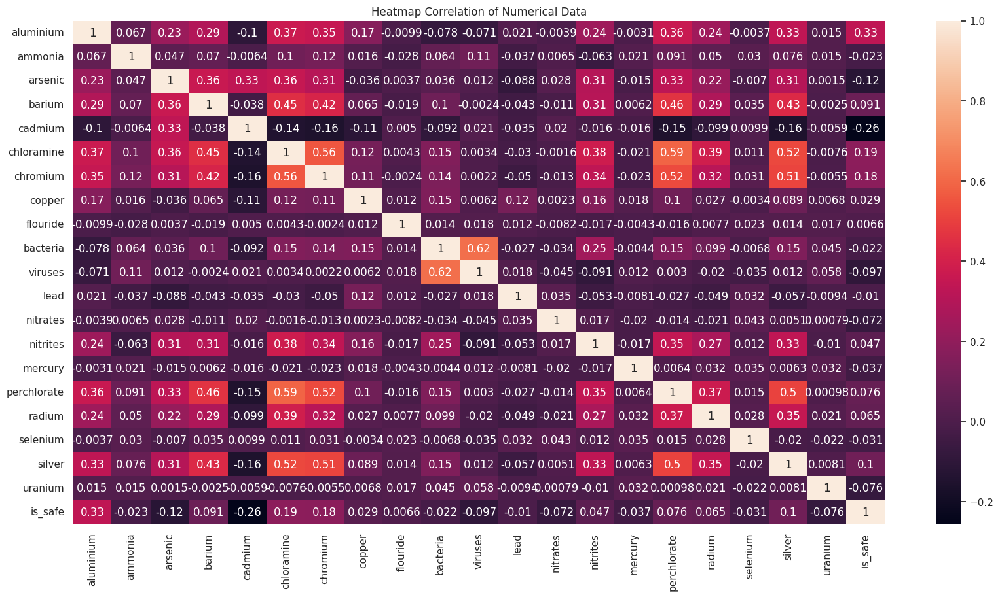

In [ ]:
#df1 = df.select_dtypes(include = 'number')
plt.figure(figsize=(20,10))
plt.title('Heatmap Correlation of Numerical Data')
sns.heatmap(filt_data.corr(),annot=True)
plt.show()

### 4. Boxplot

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


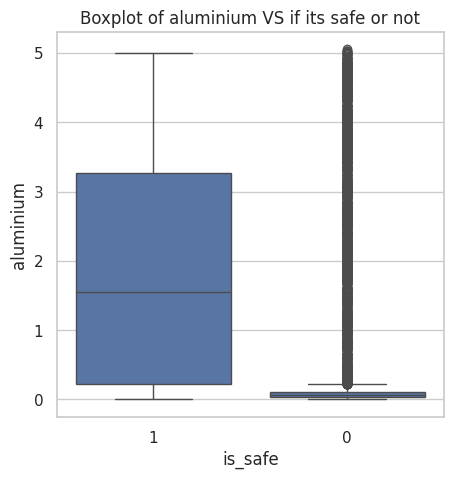

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


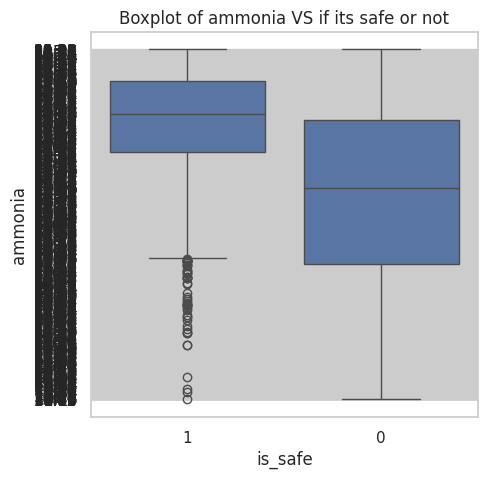

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


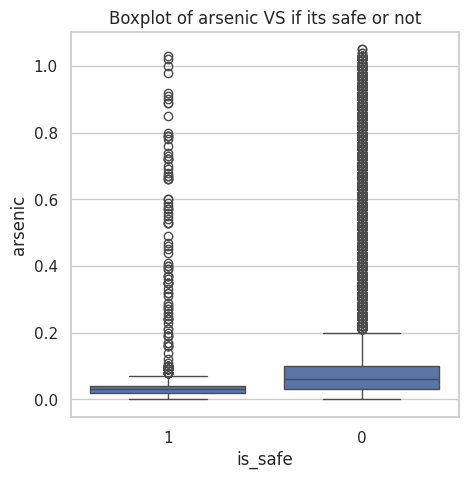

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


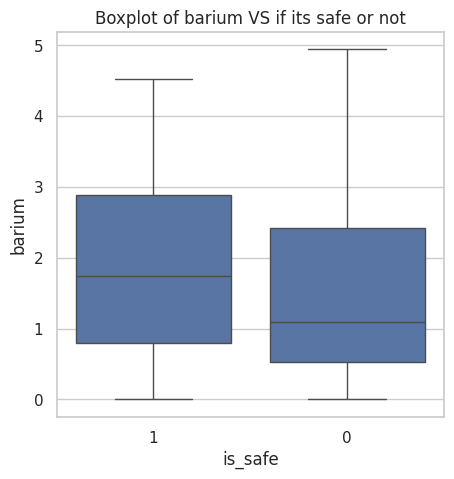

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


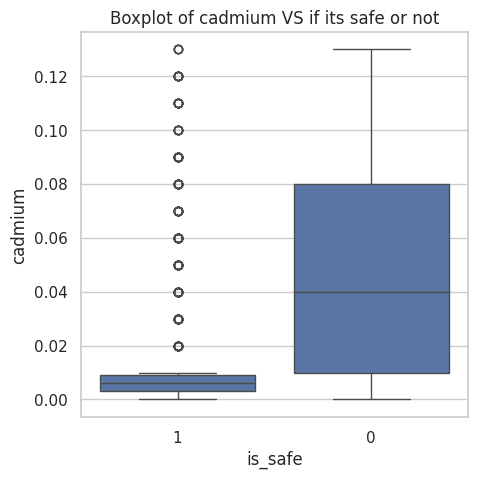

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


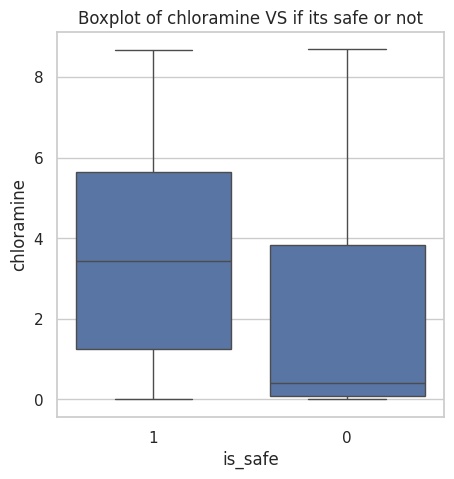

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


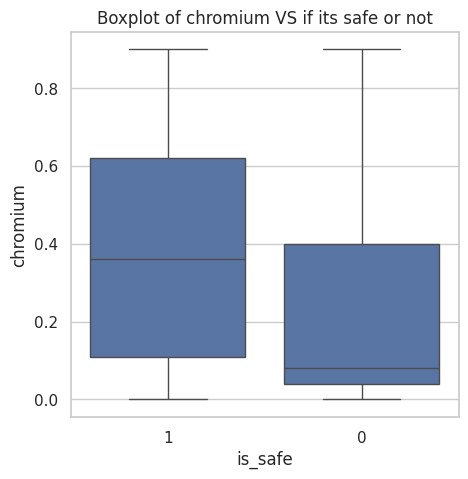

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


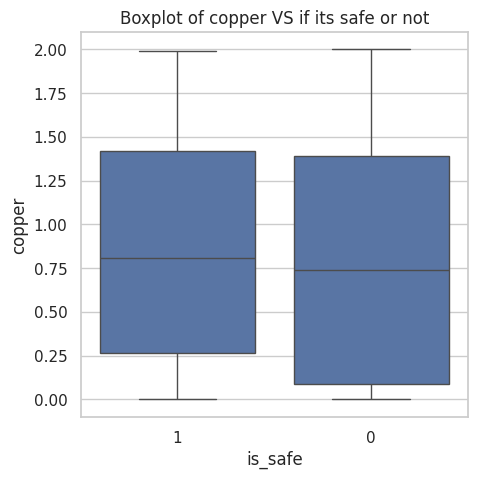

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


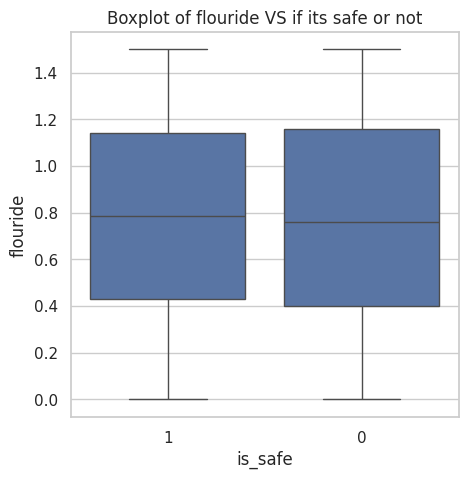

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


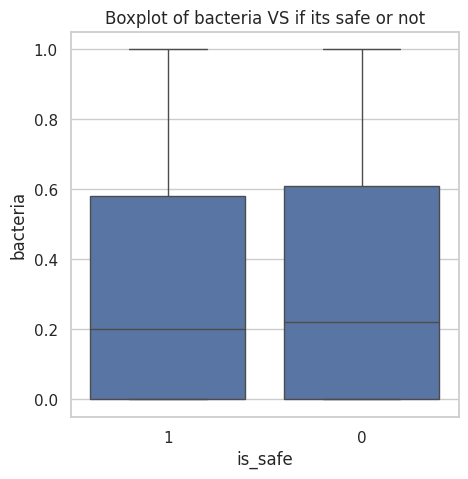

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


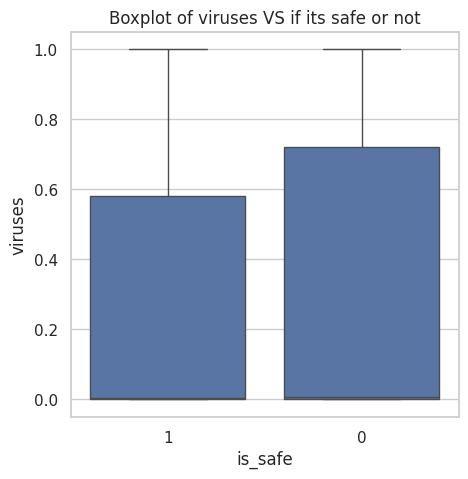

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


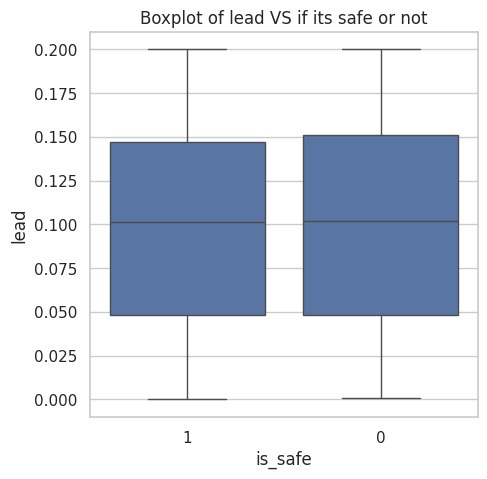

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


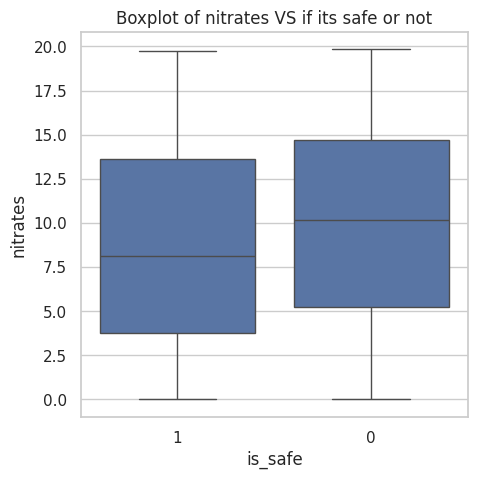

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


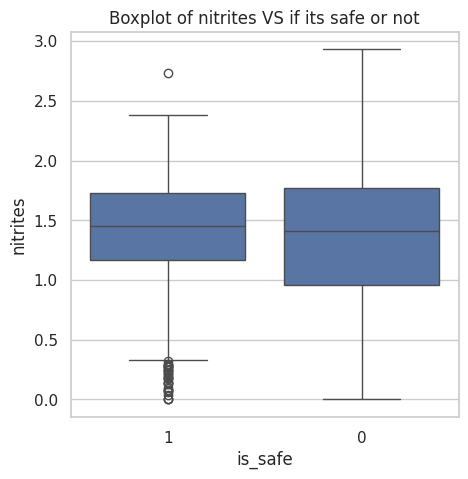

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


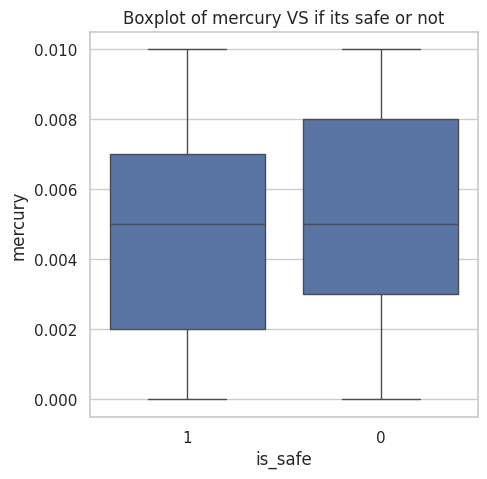

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


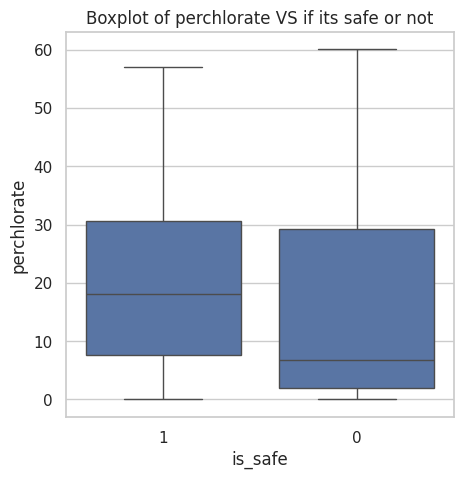

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


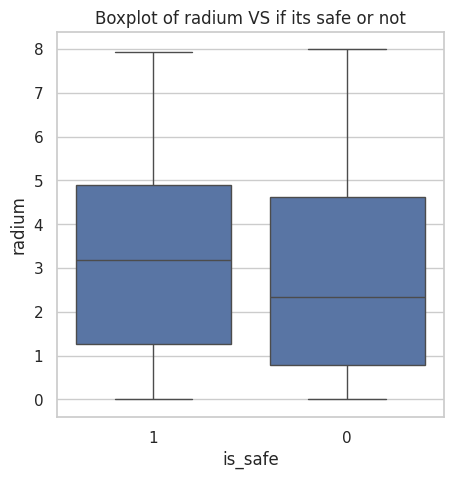

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


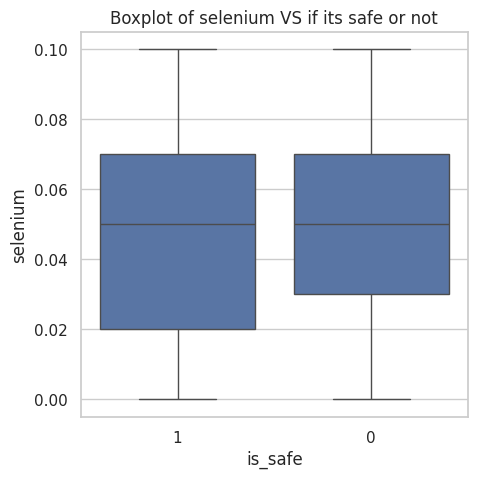

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


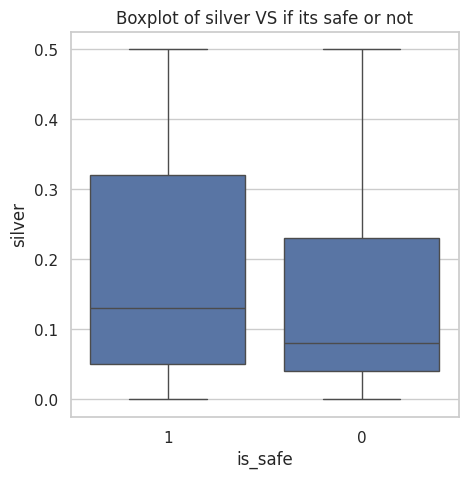

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


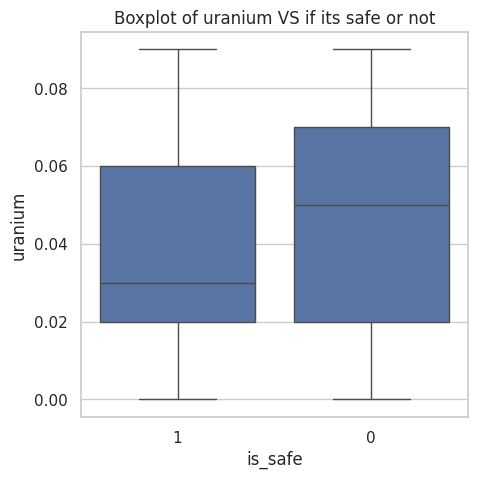

In [ ]:
for i in filt_data.columns[:-1]:
  plt.figure(figsize=(5,5))
  ay = sns.boxplot(x='is_safe', y=i, data=filt_data)
  plt.title(f"Boxplot of {i} VS if its safe or not")
  plt.show()
  print('\n')

### 5. Bar Graph

> The melt() function is used to reshape the dataframe from a wide format to long format.
```
id_vars : this parameter specifies the column that should remain unaffected during runtime (take a list input for multiple columns. We gave only 1 i.e., is_safe)
var_name : specifies the new column that will store the attribute names (takes in a string)
value_name : specifies new column that stores the values associated to that attribute (takes in a string)
```

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


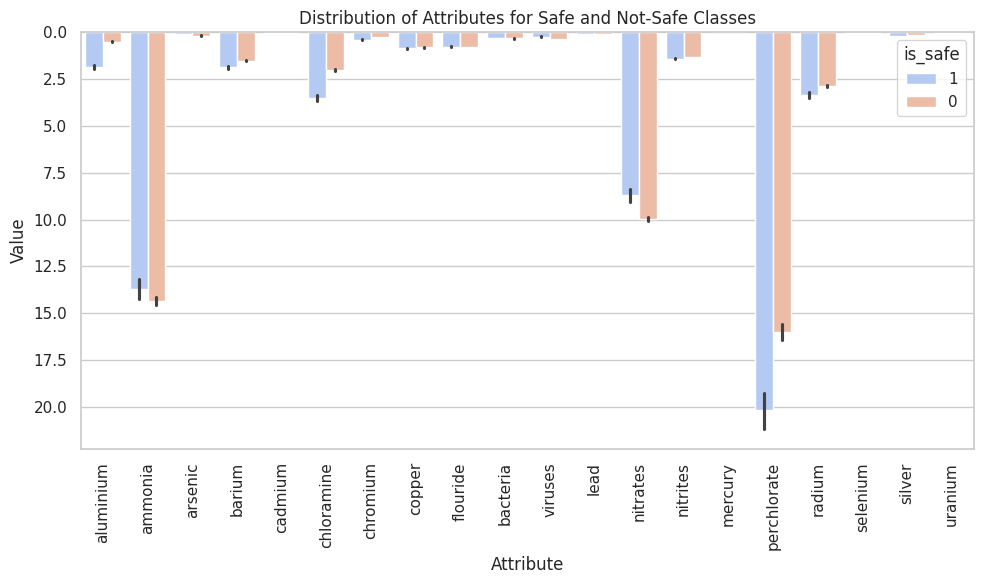

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#Creating a melted dataframe using the melt function
melted_df = filt_data.melt(id_vars=['is_safe'], var_name='Attribute', value_name='Value')

plt.figure(figsize=(10, 6))
sns.barplot(data=melted_df, x='Attribute', y='Value', hue='is_safe', palette='coolwarm')
plt.xticks(rotation=90) #Rotating x-axis label by 90 degrees
plt.title('Distribution of Attributes for Safe and Not-Safe Classes')
plt.xlabel('Attribute')
plt.ylabel('Value')
plt.tight_layout()
plt.show()


## Preprocessing Data, Normalization, Split, Train & Test

In [ ]:
# Split features and target variable
X = filt_data.drop(columns=['is_safe'])
y = filt_data['is_safe']

In [ ]:
# Normalization methods
scalers = {
  "Z-Score Normalization": StandardScaler(),
  "Min-Max Normalization": MinMaxScaler()
}

In [ ]:
# Random states for train-test split
random_states = [1, 20, 40]

In [ ]:
# Dictionary to store training and testing sets
dfsets = {}
for name, scaler in scalers.items():
  X_scaled = scaler.fit_transform(X)
  dfsets[name] = {
    "X": X_scaled,
    "y": y
  }

In [ ]:
classifiers = {
  "Decision Tree": DecisionTreeClassifier(),
  "k-NN": KNeighborsClassifier(n_neighbors=5),
  "Naive Bayes": GaussianNB(),
  "SVM (Polynomial)": SVC(kernel='poly'),
  "SVM (RBF)": SVC(kernel='rbf'),
  "Neural Networks": MLPClassifier(max_iter=300)
}

Z-Score Normalization 1 



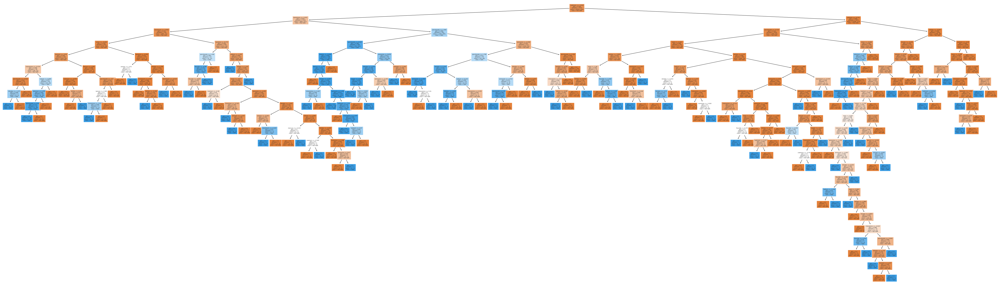

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Z-Score Normalization 20 



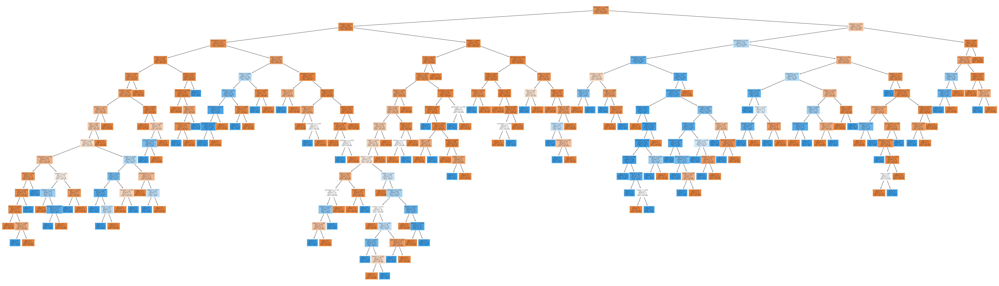

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Z-Score Normalization 40 



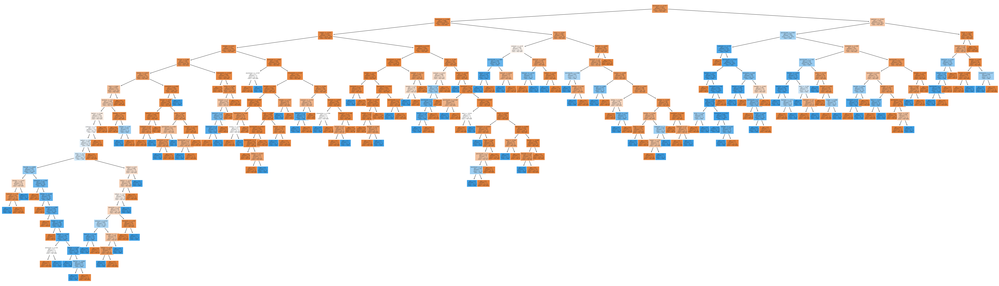

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Min-Max Normalization 1 



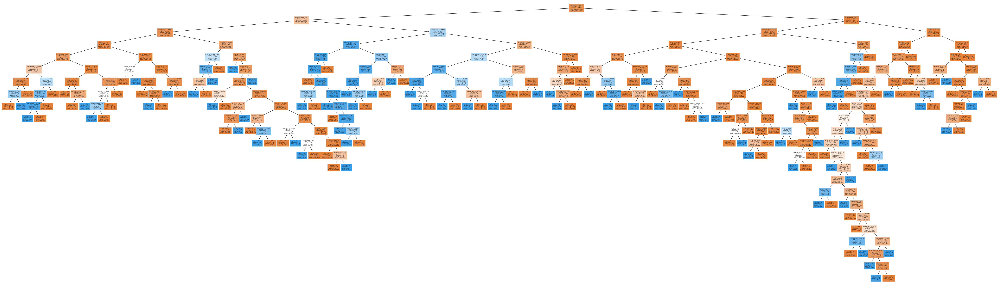

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Min-Max Normalization 20 



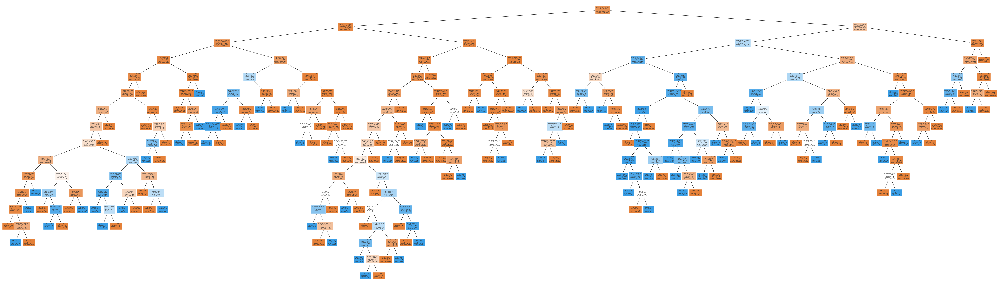

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Min-Max Normalization 40 



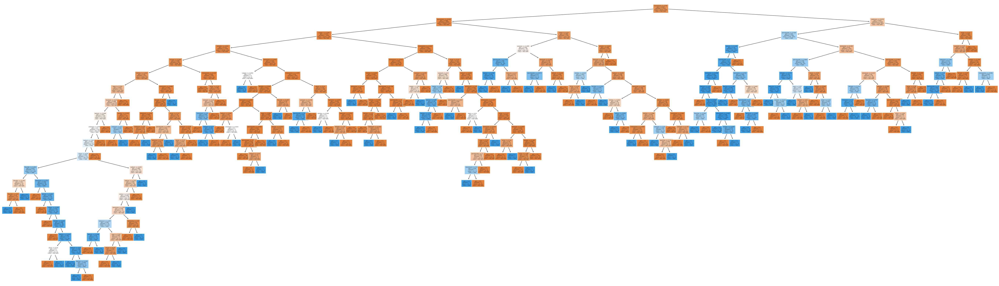

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
# Function to train classifiers and report accuracies
def train_eval(datasets, classifiers, random_states):
  results = {}
  for norm_type, data in datasets.items():
    results[norm_type] = {}
    for state in random_states:
      X_train, X_test, y_train, y_test = train_test_split(data['X'], data['y'], test_size=0.4, random_state=state)
      results[norm_type][state] = {}
      for clf_name, clf in classifiers.items():
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        results[norm_type][state][clf_name] = accuracy

        #Plot Decision tree for a better explanation
        if clf_name == "Decision Tree":
          print(norm_type, state, '\n')
          plt.figure(figsize=(70,20))
          plot_tree(clf, filled=True, feature_names=X.columns, class_names=["Not Safe", "Safe"], fontsize = 5)
          plt.show()
          print()



  return results

#Training the classifiers
results = train_eval(dfsets, classifiers, random_states)

In [ ]:
# Calculate and print average accuracies
for norm_type in results:
  print("\n",norm_type,":")
  for clf_name in classifiers:
    average_accuracy = np.mean([results[norm_type][state][clf_name]
for state in random_states])
  print(f"{clf_name}: Average Accuracy = {average_accuracy:.3f}")

#DataFrame from the results
results_flattened = []
for norm_type, norm_results in results.items():
  for state, state_results in norm_results.items():
    row = {"Normalization": norm_type, "Random State": state}
    row.update(state_results)
    results_flattened.append(row)
results_df = pd.DataFrame(results_flattened)
# average accuracies
avg_accuracies = results_df.groupby("Normalization").mean().reset_index()
print("\nClassification Results:")
print(results_df)
print("\nAverage Accuracies:")
print(avg_accuracies)


 Z-Score Normalization :
Neural Networks: Average Accuracy = 0.947

 Min-Max Normalization :
Neural Networks: Average Accuracy = 0.953

Classification Results:
           Normalization  Random State  Decision Tree      k-NN  Naive Bayes  \
0  Z-Score Normalization             1       0.951860  0.913098     0.837449   
1  Z-Score Normalization            20       0.954361  0.911222     0.850578   
2  Z-Score Normalization            40       0.941544  0.909972     0.855892   
3  Min-Max Normalization             1       0.950610  0.906846     0.837449   
4  Min-Max Normalization            20       0.952173  0.904970     0.850578   
5  Min-Max Normalization            40       0.941857  0.903407     0.855892   

   SVM (Polynomial)  SVM (RBF)  Neural Networks  
0          0.925289   0.935917         0.941544  
1          0.935292   0.941232         0.948421  
2          0.930603   0.940294         0.950610  
3          0.926540   0.930916         0.948734  
4          0.935605   0.9352

#### ***Explanation of the Above Code***

1. ```Splitting Features and Target Variable:```
The code starts by splitting the data into two parts: features (X) and the target variable (y). Here, filt_data seems to be a DataFrame containing the dataset, where 'is_safe' is the target variable and all other columns are features. So, X contains all columns except 'is_safe', and y contains only the 'is_safe' column.

2. ```Normalization Methods:```
Two normalization methods are defined in a dictionary named scalers. They are "Z-Score Normalization" and "Min-Max Normalization". Each method is associated with a specific scaler object (StandardScaler() for Z-score normalization and MinMaxScaler() for Min-Max normalization).

3. ```Random States for Train-Test Split:```
A list named random_states is created, which contains different random state values. These will be used during the train-test split for reproducibility of results.

4. ```Dictionary to Store Training and Testing Sets:```
A dictionary named dfsets is initialized to store the scaled feature matrix (X) and the target variable (y) for each normalization method. Inside a loop iterating over the normalization methods, the features (X) are scaled using the corresponding scaler object, and both the scaled features (X_scaled) and the target variable (y) are stored in the dfsets dictionary.

5. ```Classifiers:```
Several classifiers are defined in a dictionary named classifiers. These include Decision Tree, k-NN (k-Nearest Neighbors), Naive Bayes, SVM (Support Vector Machine) with Polynomial kernel, SVM with RBF (Radial Basis Function) kernel, and Neural Networks.

6. ```Train and Evaluate Function:```
A function named train_eval is defined to train the classifiers on different datasets and report accuracies. This function takes three arguments: datasets (dictionary containing scaled features and target variable for each normalization method), classifiers (dictionary containing different classifier objects), and random_states (list containing random state values for train-test split). Inside the function, a nested loop iterates over the normalization methods, random states, and classifiers. For each combination, it splits the data into training and testing sets using train_test_split(), trains the classifier, predicts the target variable on the test set, calculates accuracy using accuracy_score(), and stores the accuracy in a nested dictionary results.

7. ```Training the Classifiers:```
The train_eval function is called with the dfsets, classifiers, and random_states as arguments, and the results are stored in the results dictionary.

8. ```Calculating and Printing Average Accuracies:```
For each normalization method, the code calculates the average accuracy for each classifier across different random states and prints it. Inside a loop iterating over the normalization methods, another loop iterates over the classifiers, and for each classifier, the average accuracy is calculated using NumPy's np.mean() function.

9. ```Creating DataFrame from Results:```
The results are flattened and stored in a DataFrame named results_df. This DataFrame contains columns for normalization method, random state, and accuracy scores for each classifier.

10. ```Calculating Average Accuracies from DataFrame:```
The average accuracies are calculated from the results_df DataFrame by grouping the data by normalization method and calculating the mean accuracy for each classifier. The results are stored in a DataFrame named avg_accuracies.

Overall, the code performs classification tasks on a dataset using multiple classifiers and evaluates their performance under different normalization methods and random states. It provides insights into which classifier performs better under different conditions and normalization techniques.


---
---

## **REFERENCES**

> 1. [**An Artificial Neural Network Model for Water Quality and
Water Consumption Prediction**](https://repositorio.unic.co.ao/id/eprint/5425/1/water-14-03359-v2.pdf)
> 2. [**How to Make a Seaborn Histogram: A Detailed Guide**](https://www.datacamp.com/tutorial/how-to-make-a-seaborn-histogram)
> 3. [**Machine Learning: Graphical Mode**](https://jonathan-hui.medium.com/machine-learning-graphical-model-b68b0c27a749)
> 4. [**Pandas Dataframe**](https://pandas.pydata.org/docs/reference/frame.html)